# AGRICULTURA DE PRECISION

## Importación de librerías

Buscamos todas las librerías necesarias para comenzar el análisis de datos mediante técnicas de regresión.

In [16]:
#Librerías requeridas para el procesamiento de datos
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import ppscore as pps

# Librerias requeridas para el proceso de modelamiento
from sklearn.metrics import f1_score, precision_score, recall_score, make_scorer
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score, precision_score, recall_score, make_scorer, median_absolute_error, r2_score, mean_squared_error, mean_absolute_error, accuracy_score
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.neighbors import KNeighborsRegressor

## Carga de la información

In [17]:
FILEPATH = 'data/data_perfil_racimo.csv'
data = pd.read_csv(FILEPATH)

In [18]:
print(f"El conjunto de datos tiene {data.shape[0]} filas y {data.shape[1]} columnas.")

El conjunto de datos tiene 58461 filas y 29 columnas.


In [19]:
data.head()

,finca,lote,anio,semana,edad_racimo,peso_racimo,calibre_segunda_mano,calibre_ultima_mano,cantidad_manos,largo_segunda_mano,...,air_temperature_max_avg,air_temperature_min_avg,relative_humidity_avg,wind_speed_avg,solar_radiation_avg,daiy_et0_avg,wind_dir_avg,daily_rain_avg,year_rain_avg,sunny_hours_avg
0,80101,4339,2019,34,11.0,18.000000,14.0,8.000000,6.0,10.00,...,34.15,26.800422,91.075092,-3998.061084,-3999.516118,-3999.567575,-1884.160294,0.073005,-3058.008869,-1999.783364
1,38,2815,2020,29,11.0,17.328571,13.0,9.714285,6.0,9.50,...,34.43,27.066091,89.824399,-3330.838532,-3332.900450,-3332.957297,-3214.666836,0.003025,-6442.684275,0.015139
2,80229,2234,2019,13,11.0,19.100000,12.0,7.000000,6.0,10.00,...,35.29,27.123032,81.976500,-3994.841460,-3999.524897,-3999.533633,-1929.082297,0.007589,-3968.857113,-1999.784506
3,80101,3134,2019,2,12.0,22.000000,13.0,9.000000,7.0,9.90,...,33.50,26.088297,84.572279,-3996.735963,-3999.530365,-3999.547913,-1975.916736,0.013154,-3994.221339,-3999.588513
4,80220,2181,2019,35,11.0,24.100000,14.0,9.000000,7.5,10.75,...,59.67,27.943848,89.157047,-3002.449064,-3004.459172,-3004.516568,-2208.130850,0.044517,-1876.856280,-673.057810


In [15]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58461 entries, 0 to 58460
Data columns (total 29 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   finca                    58461 non-null  int64  
 1   lote                     58461 non-null  int64  
 2   anio                     58461 non-null  int64  
 3   semana                   58461 non-null  int64  
 4   edad_racimo              58461 non-null  float64
 5   peso_racimo              58461 non-null  float64
 6   calibre_segunda_mano     58461 non-null  float64
 7   calibre_ultima_mano      58461 non-null  float64
 8   cantidad_manos           58461 non-null  float64
 9   largo_segunda_mano       58461 non-null  float64
 10  largo_ultima_mano        58461 non-null  float64
 11  peso_vastago             58461 non-null  float64
 12  peso_fruta               58461 non-null  float64
 13  porcentaje_vastago       58461 non-null  float64
 14  ratio                 

In [16]:
data.describe()

,finca,lote,anio,semana,edad_racimo,peso_racimo,calibre_segunda_mano,calibre_ultima_mano,cantidad_manos,largo_segunda_mano,...,air_temperature_max_avg,air_temperature_min_avg,relative_humidity_avg,wind_speed_avg,solar_radiation_avg,daiy_et0_avg,wind_dir_avg,daily_rain_avg,year_rain_avg,sunny_hours_avg
count,58461.000000,58461.000000,58461.000000,58461.000000,58461.000000,58461.000000,58461.000000,58461.000000,58461.000000,58461.000000,...,58461.000000,58461.000000,58461.000000,58461.000000,58461.000000,58461.000000,58461.000000,58461.000000,58461.000000,58461.000000
mean,55833.025402,2469.612545,2018.956193,24.143651,10.832222,23.006030,12.823038,9.062427,6.822547,10.686496,...,56.491148,26.379175,-896.677414,-3939.907539,-3942.304696,-3942.429278,-2880.314362,0.062272,-4909.010894,-1775.906135
std,35119.594683,1589.171738,0.838017,14.734012,0.470544,18.962449,4.808509,24.713692,1.563628,37.022850,...,32.378095,4.817358,1431.372904,482.473208,482.509406,482.514759,1077.002214,0.057294,1243.082590,885.579929
min,30.000000,52.000000,2017.000000,1.000000,8.000000,2.000000,0.000000,0.000000,0.000000,0.000000,...,32.830000,13.292948,-4954.775974,-4998.671443,-4999.455940,-4999.471666,-4968.305764,0.000000,-7216.519866,-4145.755836
25%,7221.000000,1771.000000,2018.000000,11.000000,10.594594,19.650000,12.000000,8.000000,6.000000,9.600000,...,34.700000,26.314880,-1930.877211,-3998.253539,-3999.541366,-3999.577626,-3925.858911,0.010803,-5936.474345,-1999.789457
50%,80101.000000,2234.000000,2019.000000,23.000000,11.000000,22.218750,12.882352,8.666666,6.777777,9.900000,...,37.850000,27.030127,85.350377,-3997.665339,-3999.517937,-3999.562846,-2350.567241,0.049315,-5404.457738,-1999.782933
75%,80225.000000,4161.000000,2020.000000,36.000000,11.000000,25.454545,13.375000,9.391304,7.050000,10.154545,...,70.170000,27.501663,90.070256,-3995.287913,-3999.496077,-3999.527387,-1915.412933,0.098093,-3927.170714,-1999.777935
max,80980.000000,5455.000000,2020.000000,52.000000,13.000000,2110.666666,429.694444,5075.000000,97.000000,5004.000000,...,207.800000,37.827563,96.405476,-2491.704052,-2494.859822,-2494.860656,47.572901,0.237767,-1876.856280,0.024417


In [17]:
# Porcentaje de valores faltantes
missing_values = data.isnull().mean() * 100
missing_values

finca                      0.0
lote                       0.0
anio                       0.0
semana                     0.0
edad_racimo                0.0
peso_racimo                0.0
calibre_segunda_mano       0.0
calibre_ultima_mano        0.0
cantidad_manos             0.0
largo_segunda_mano         0.0
largo_ultima_mano          0.0
peso_vastago               0.0
peso_fruta                 0.0
porcentaje_vastago         0.0
ratio                      0.0
peso_total_defectos        0.0
anio.1                     0.0
semana.1                   0.0
air_temperature_avg        0.0
air_temperature_max_avg    0.0
air_temperature_min_avg    0.0
relative_humidity_avg      0.0
wind_speed_avg             0.0
solar_radiation_avg        0.0
daiy_et0_avg               0.0
wind_dir_avg               0.0
daily_rain_avg             0.0
year_rain_avg              0.0
sunny_hours_avg            0.0
dtype: float64

In [18]:
# Porcentaje de datos atípicos leves
Q1 = data.quantile(0.25)
Q3 = data.quantile(0.75)
IQR = Q3 - Q1

mild_outliers = ((data < (Q1 - 1.5*IQR)) | (data > (Q3 + 1.5*IQR))).mean() * 100
mild_outliers

finca                       0.000000
lote                        0.000000
anio                        0.000000
semana                      0.000000
edad_racimo                 5.755974
peso_racimo                 1.029746
calibre_segunda_mano        3.602402
calibre_ultima_mano         4.204512
cantidad_manos              2.555550
largo_segunda_mano          5.265048
largo_ultima_mano           6.939669
peso_vastago                2.037256
peso_fruta                  1.140932
porcentaje_vastago          9.868117
ratio                      10.962864
peso_total_defectos         6.934538
anio.1                      0.000000
semana.1                    0.000000
air_temperature_avg        19.159782
air_temperature_max_avg     4.934914
air_temperature_min_avg    18.451617
relative_humidity_avg       0.000000
wind_speed_avg             26.142214
solar_radiation_avg        36.845076
daiy_et0_avg               39.068781
wind_dir_avg                0.000000
daily_rain_avg              0.520005
y

In [19]:
# Porcentaje de datos atípicos extremos
extreme_outliers = ((data < (Q1 - 3*IQR)) | (data > (Q3 + 3*IQR))).mean() * 100
extreme_outliers

finca                       0.000000
lote                        0.000000
anio                        0.000000
semana                      0.000000
edad_racimo                 0.427636
peso_racimo                 0.218949
calibre_segunda_mano        2.281863
calibre_ultima_mano         2.228836
cantidad_manos              0.567900
largo_segunda_mano          2.570945
largo_ultima_mano           2.618840
peso_vastago                0.554216
peso_fruta                  0.260002
porcentaje_vastago          2.914764
ratio                      10.398385
peso_total_defectos         3.166213
anio.1                      0.000000
semana.1                    0.000000
air_temperature_avg        18.451617
air_temperature_max_avg     0.591848
air_temperature_min_avg    18.451617
relative_humidity_avg       0.000000
wind_speed_avg             26.142214
solar_radiation_avg        36.845076
daiy_et0_avg               39.068781
wind_dir_avg                0.000000
daily_rain_avg              0.000000
y

In [20]:
# Porcentaje de datos negativos
negative = (data < 0).mean() * 100
negative

finca                        0.000000
lote                         0.000000
anio                         0.000000
semana                       0.000000
edad_racimo                  0.000000
peso_racimo                  0.000000
calibre_segunda_mano         0.000000
calibre_ultima_mano          0.000000
cantidad_manos               0.000000
largo_segunda_mano           0.000000
largo_ultima_mano            0.000000
peso_vastago                 0.000000
peso_fruta                   0.000000
porcentaje_vastago           0.000000
ratio                        0.677375
peso_total_defectos          0.000000
anio.1                       0.000000
semana.1                     0.000000
air_temperature_avg          0.000000
air_temperature_max_avg      0.000000
air_temperature_min_avg      0.000000
relative_humidity_avg       37.031525
wind_speed_avg             100.000000
solar_radiation_avg        100.000000
daiy_et0_avg               100.000000
wind_dir_avg                99.264467
daily_rain_a

Una simple inspección al dataset nos permiten identificar que existen outliers que pueden distorcionar el resultado final de nuestro análisis de clusters. Algunos de los hallazgos son:
- Datos nulos en variables importantes para nuestro análisis (CustomerID).
- Datos extremos que causan intervalos distorcionados en los histogramas.
- Datos negativos en caracteristicas que solo tienen magnitud.
- Variables no necesarias para un análisis predictivo.

In [21]:
corrM = data.corr()
corrM.style.background_gradient(cmap='coolwarm').set_precision(2)

,finca,lote,anio,semana,edad_racimo,peso_racimo,calibre_segunda_mano,calibre_ultima_mano,cantidad_manos,largo_segunda_mano,largo_ultima_mano,peso_vastago,peso_fruta,porcentaje_vastago,ratio,peso_total_defectos,anio.1,semana.1,air_temperature_avg,air_temperature_max_avg,air_temperature_min_avg,relative_humidity_avg,wind_speed_avg,solar_radiation_avg,daiy_et0_avg,wind_dir_avg,daily_rain_avg,year_rain_avg,sunny_hours_avg
finca,1.00,0.63,-0.07,-0.05,0.03,-0.03,-0.07,-0.01,-0.01,-0.01,0.00,-0.06,-0.02,-0.02,0.02,-0.05,-0.07,-0.05,-0.01,0.05,-0.01,-0.09,-0.01,-0.01,-0.01,-0.05,-0.01,-0.08,-0.06
lote,0.63,1.00,-0.07,-0.07,0.10,-0.05,-0.01,0.00,-0.05,-0.01,-0.00,-0.09,-0.05,0.01,0.05,-0.03,-0.07,-0.07,-0.03,0.07,-0.04,-0.12,-0.03,-0.03,-0.03,-0.10,-0.01,-0.13,-0.01
anio,-0.07,-0.07,1.00,-0.12,0.09,0.09,0.06,0.01,0.09,-0.00,-0.01,0.23,0.07,0.07,0.01,-0.03,1.00,-0.12,0.09,-0.63,0.11,0.78,0.24,0.24,0.24,0.50,-0.32,0.05,0.48
semana,-0.05,-0.07,-0.12,1.00,-0.07,0.01,0.08,0.02,-0.01,-0.00,-0.00,0.04,0.01,0.03,-0.02,0.03,-0.12,1.00,0.19,0.17,0.18,-0.02,-0.15,-0.15,-0.15,-0.24,0.23,0.40,0.34
edad_racimo,0.03,0.10,0.09,-0.07,1.00,0.02,-0.01,-0.01,0.04,-0.01,-0.00,0.04,0.02,-0.01,0.01,-0.00,0.09,-0.07,-0.12,-0.04,-0.12,-0.02,-0.03,-0.03,-0.03,-0.01,-0.03,-0.11,0.04
peso_racimo,-0.03,-0.05,0.09,0.01,0.02,1.00,0.03,0.00,0.08,0.01,0.00,0.29,1.00,-0.02,0.03,0.00,0.09,0.01,0.04,-0.05,0.04,0.07,-0.00,-0.00,-0.00,0.02,-0.06,-0.00,0.04
calibre_segunda_mano,-0.07,-0.01,0.06,0.08,-0.01,0.03,1.00,0.06,0.03,0.03,0.04,0.08,0.02,0.03,0.01,0.00,0.06,0.08,0.03,-0.03,0.03,0.05,-0.05,-0.05,-0.05,-0.03,-0.03,0.03,0.07
calibre_ultima_mano,-0.01,0.00,0.01,0.02,-0.01,0.00,0.06,1.00,0.03,-0.00,0.17,0.01,0.00,0.01,0.00,0.00,0.01,0.02,0.01,-0.01,0.01,0.01,-0.01,-0.01,-0.01,-0.01,-0.01,0.01,0.01
cantidad_manos,-0.01,-0.05,0.09,-0.01,0.04,0.08,0.03,0.03,1.00,0.01,0.07,0.18,0.07,0.02,0.02,0.00,0.09,-0.01,0.01,-0.05,0.02,0.06,0.02,0.01,0.01,0.02,-0.05,-0.00,0.05
largo_segunda_mano,-0.01,-0.01,-0.00,-0.00,-0.01,0.01,0.03,-0.00,0.01,1.00,0.01,0.00,0.01,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,-0.00


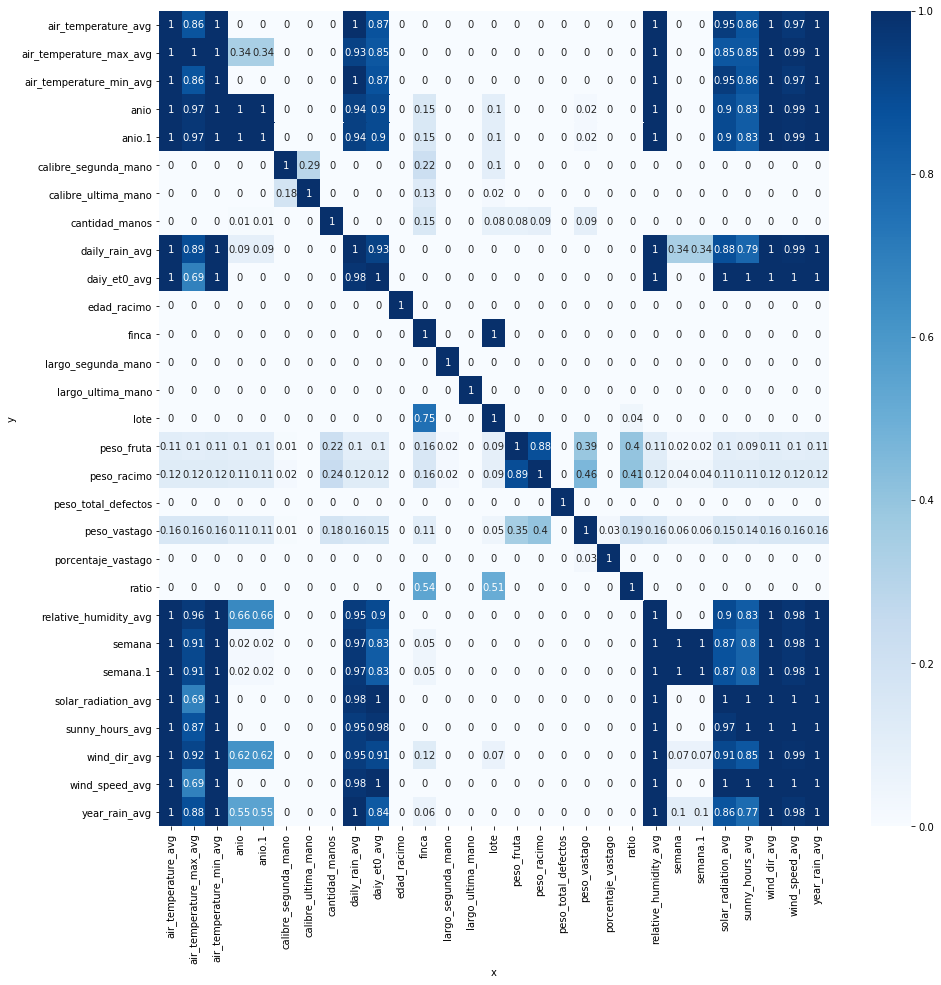

In [22]:
pps_data = pps.matrix(data)[['x', 'y', 'ppscore']].pivot(columns='x', index='y', values='ppscore')
pps_data = pps_data.apply(lambda x: round(x, 2))

fig, ax = plt.subplots(figsize=(15,15)) 
sns.heatmap(pps_data, vmin=0, vmax=1, cmap="Blues", annot=True)

# PREPARACIÓN DE LOS DATOS (Feature Engineering)

### Identificación de variables

* Propiedades del conjunto de datos
* Tipos de datos (verificar carga correcta de datos)

In [20]:
subset = data[["edad_racimo", "peso_racimo", "calibre_segunda_mano", "calibre_ultima_mano", "cantidad_manos", 
              "largo_segunda_mano", "largo_ultima_mano", "peso_vastago", "peso_fruta", "peso_total_defectos"]]
subset.describe()

,edad_racimo,peso_racimo,calibre_segunda_mano,calibre_ultima_mano,cantidad_manos,largo_segunda_mano,largo_ultima_mano,peso_vastago,peso_fruta,peso_total_defectos
count,58461.000000,58461.000000,58461.000000,58461.000000,58461.000000,58461.000000,58461.000000,58461.000000,58461.000000,58461.000000
mean,10.832222,23.006030,12.823038,9.062427,6.822547,10.686496,17.405573,2.368157,20.637873,80.750638
std,0.470544,18.962449,4.808509,24.713692,1.563628,37.022850,159.248087,0.945104,18.705884,862.939196
min,8.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.600000,0.100000,0.100000
25%,10.594594,19.650000,12.000000,8.000000,6.000000,9.600000,8.000000,1.958139,17.633333,2.600000
50%,11.000000,22.218750,12.882352,8.666666,6.777777,9.900000,8.140000,2.280000,19.900000,5.200000
75%,11.000000,25.454545,13.375000,9.391304,7.050000,10.154545,8.300000,2.664705,22.800000,10.200000
max,13.000000,2110.666666,429.694444,5075.000000,97.000000,5004.000000,5104.000000,139.000000,2108.191666,55913.600000


### Tratamiento de duplicados

* Eliminar variables duplicadas (columnas)
* Eliminar registros duplicados (filas)
* Eliminar variables irrelevantes (ID, cedula, nombre, teléfono)

No se deben eliminar las entradas duplicadas de este subconjunto de datos porque son registros válidos.

### Tratamiento de outliers (eliminar registros, eliminar variables, imputar, predecir)

Algunos outliers tienen valores cuya magnitud no tiene significado físico. Si reemplazamos todos estos datos imposibles por un estadístico de tendencia central, la frecuencia de este valor aumentaría y la distribución de la variable tendría un pico allí sin justificación. Por ende, se procede a reemplazar esos valores atípicos sin significado físico por valores nulos, con el fin de eliminarlos posteriormente.

In [21]:
# Función para reemplazar los valores atípicos sin significado físico por NaN
def anular(data, thresh = 0.05, lowlim = None, uplim = None):
    data_copy = data.copy()
    if lowlim is None:
        qleft = data.quantile(thresh) # Límite izquierdo no especificado
    else:
        qleft = lowlim # Límite izquierdo especificado
    if uplim is None:
        qright = data.quantile(1-thresh) # Límite derecho no especificado
    else:
        qright = uplim # Límite derecho especificado
    
    data_copy[(data < qleft) | (data > qright)] = np.nan
    return data_copy

In [22]:
data_clean = subset.copy() # Dataframe de datos reemplazados
data_clean['peso_racimo'] = anular(subset['peso_racimo'])
data_clean['calibre_segunda_mano'] = anular(subset['calibre_segunda_mano'])
data_clean['calibre_ultima_mano'] = anular(subset['calibre_ultima_mano'])
data_clean['cantidad_manos'] = anular(subset['cantidad_manos'])
data_clean['largo_segunda_mano'] = anular(subset['largo_segunda_mano'])
data_clean['largo_ultima_mano'] = anular(subset['largo_ultima_mano'])
data_clean['peso_vastago'] = anular(subset['peso_vastago'])
data_clean['peso_fruta'] = anular(subset['peso_fruta'])
data_clean['peso_total_defectos'] = anular(subset['peso_total_defectos'])

In [23]:
nan_filas = data_clean[data_clean.isnull().any(axis=1)]
nan_filas.head()

,edad_racimo,peso_racimo,calibre_segunda_mano,calibre_ultima_mano,cantidad_manos,largo_segunda_mano,largo_ultima_mano,peso_vastago,peso_fruta,peso_total_defectos
0,11.0,18.000000,14.00,8.000000,6.0,10.0,NaN,2.000000,16.000,2.4
4,11.0,24.100000,14.00,9.000000,7.5,NaN,8.650000,2.350000,21.750,6.4
5,11.0,28.971428,14.00,10.285714,7.0,NaN,8.114285,3.171428,25.800,6.7
6,12.0,20.200000,14.00,9.000000,7.0,NaN,NaN,2.000000,18.200,1.0
7,11.0,17.150000,13.75,9.750000,NaN,9.1,8.025000,1.775000,15.375,8.0


In [24]:
# Sin datos extremos imposibles
data_clean = data_clean.dropna()
data_clean.shape

(34752, 10)

In [25]:
data_clean.describe()

,edad_racimo,peso_racimo,calibre_segunda_mano,calibre_ultima_mano,cantidad_manos,largo_segunda_mano,largo_ultima_mano,peso_vastago,peso_fruta,peso_total_defectos
count,34752.000000,34752.000000,34752.000000,34752.000000,34752.000000,34752.000000,34752.000000,34752.000000,34752.000000,34752.000000
mean,10.826778,22.501160,12.770725,8.693875,6.735078,9.896578,8.159552,2.304042,20.197118,7.031554
std,0.443488,3.010565,0.721448,0.881293,0.579141,0.351818,0.188274,0.378354,2.694008,5.356065
min,8.000000,16.250000,11.000000,7.000000,5.666666,9.000000,7.750000,1.600000,14.500000,0.900000
25%,10.600000,20.057142,12.153846,8.000000,6.250000,9.666666,8.000000,2.000000,18.047711,2.900000
50%,11.000000,22.214285,12.857142,8.600000,6.750000,9.900000,8.133333,2.266666,19.920000,5.400000
75%,11.000000,24.888888,13.214285,9.200000,7.000000,10.100781,8.290000,2.591666,22.275000,9.700000
max,13.000000,29.611764,14.400000,11.000000,8.000000,10.700000,8.700000,3.307692,26.500000,25.700000


### Tratamiento de datos nulos (eliminar registros, eliminar variables, imputar o predecir)

No hay datos nulos.

In [29]:
data_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 34752 entries, 1 to 58460
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   edad_racimo           34752 non-null  float64
 1   peso_racimo           34752 non-null  float64
 2   calibre_segunda_mano  34752 non-null  float64
 3   calibre_ultima_mano   34752 non-null  float64
 4   cantidad_manos        34752 non-null  float64
 5   largo_segunda_mano    34752 non-null  float64
 6   largo_ultima_mano     34752 non-null  float64
 7   peso_vastago          34752 non-null  float64
 8   peso_fruta            34752 non-null  float64
 9   peso_total_defectos   34752 non-null  float64
dtypes: float64(10)
memory usage: 2.9 MB


### Transformación de variables desde las reglas del negocio

* Discretización o Binning: convertir de número a categoría
* Crear variables Dummy: convertir de categoría a número


No hay variables categóricas y las variables numéricas existentes no requieren discretización porque son continuas.

### Creación de variables (fecha y otros)

En este caso no se crean variables de series de tiempo.

### Transformación datos para el método

<AxesSubplot:xlabel='peso_total_defectos'>

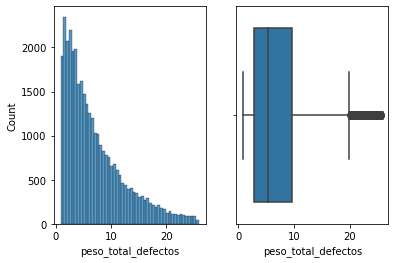

In [26]:
# peso_total_defectos, ¿distribuye exponencialmente?
fig, axs = plt.subplots(ncols=2)
sns.histplot(x = data_clean['peso_total_defectos'], binwidth = 0.5, ax = axs[0])
sns.boxplot(x = data_clean['peso_total_defectos'], ax = axs[1])

In [76]:
import pandas_profiling # Library for automatic EDA
report_clean = pandas_profiling.ProfileReport(data_clean)
display(report_clean)

Imported AutoViz_Class version: 0.0.81. Call using:
    from autoviz.AutoViz_Class import AutoViz_Class
    AV = AutoViz_Class()
    AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0,
                            lowess=False,chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 saves plots in your local machine under AutoViz_Plots directory and does not display charts.
Shape of your Data Set: (34752, 11)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    Number of Numeric Columns =  10
    Number of Integer-Categorical Columns =  0
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  

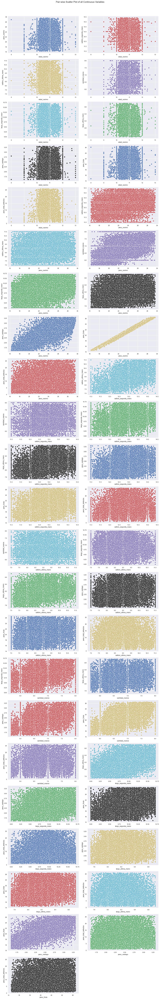

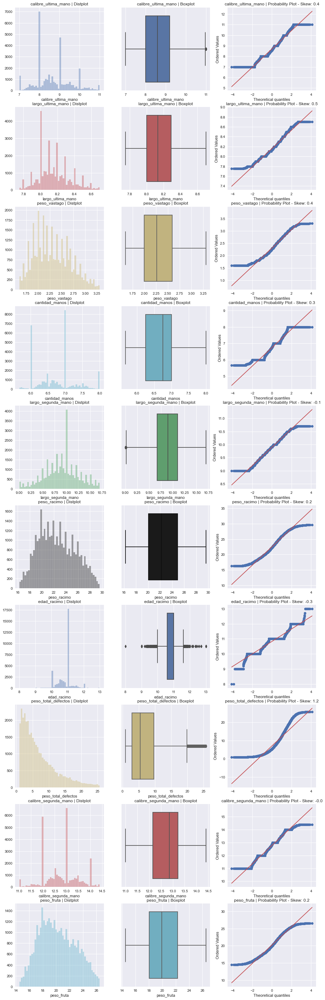

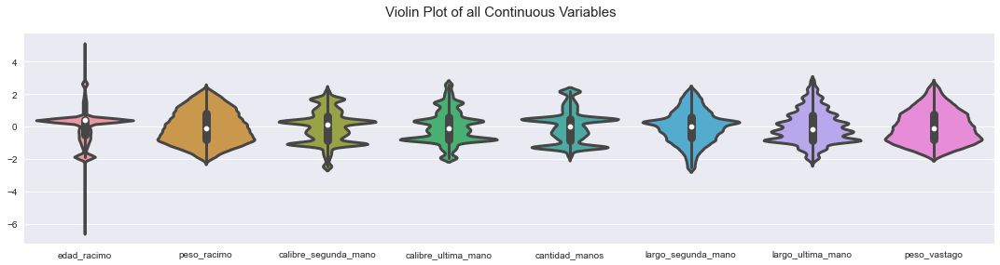

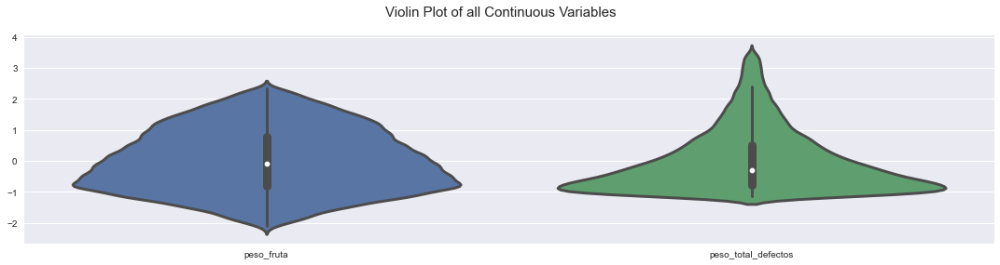

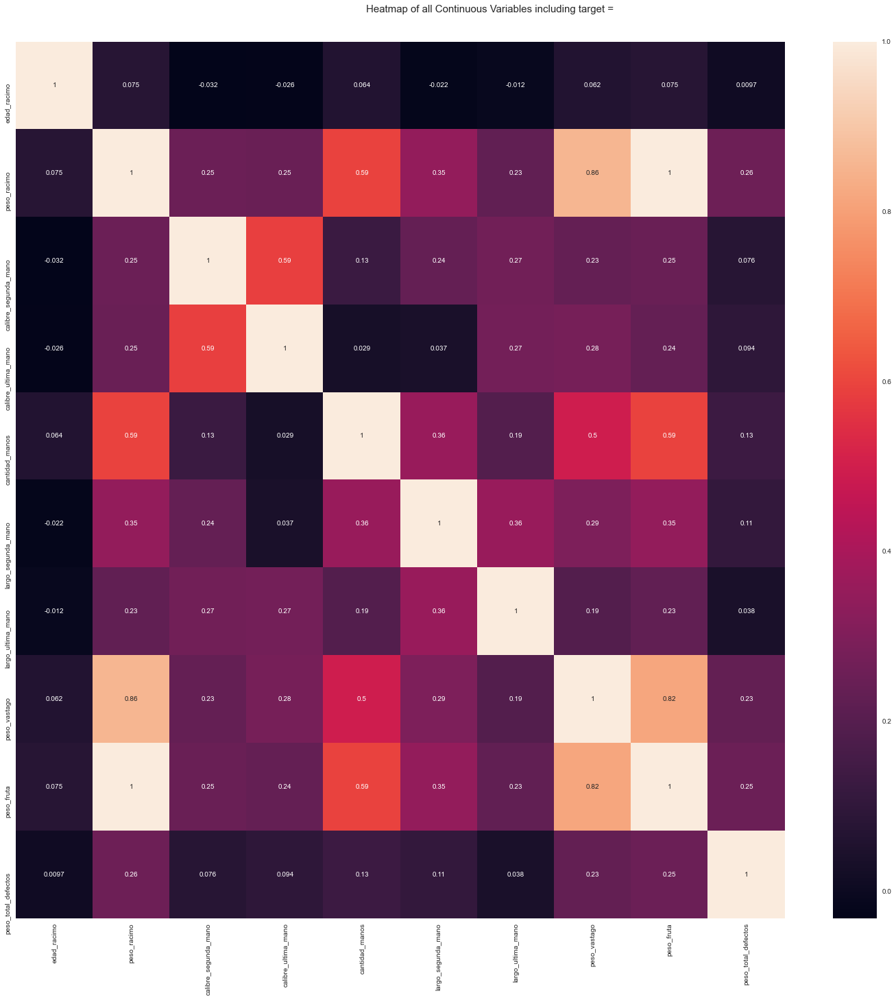

No categorical or numeric vars in data set. Hence no bar charts.
Time to run AutoViz (in seconds) = 27.929

 ###################### VISUALIZATION Completed ########################


In [77]:
data_clean.to_csv("data/data_clean.csv")

from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()

report_2 = AV.AutoViz("data/data_clean.csv")

In [31]:
corr_clean = data_clean.corr()
corr_clean.style.background_gradient(cmap='coolwarm').set_precision(2)

,edad_racimo,peso_racimo,calibre_segunda_mano,calibre_ultima_mano,cantidad_manos,largo_segunda_mano,largo_ultima_mano,peso_vastago,peso_fruta,peso_total_defectos
edad_racimo,1.00,0.07,-0.03,-0.03,0.06,-0.02,-0.01,0.06,0.07,0.01
peso_racimo,0.07,1.00,0.25,0.25,0.59,0.35,0.23,0.86,1.00,0.26
calibre_segunda_mano,-0.03,0.25,1.00,0.59,0.13,0.24,0.27,0.23,0.25,0.08
calibre_ultima_mano,-0.03,0.25,0.59,1.00,0.03,0.04,0.27,0.28,0.24,0.09
cantidad_manos,0.06,0.59,0.13,0.03,1.00,0.36,0.19,0.50,0.59,0.13
largo_segunda_mano,-0.02,0.35,0.24,0.04,0.36,1.00,0.36,0.29,0.35,0.11
largo_ultima_mano,-0.01,0.23,0.27,0.27,0.19,0.36,1.00,0.19,0.23,0.04
peso_vastago,0.06,0.86,0.23,0.28,0.50,0.29,0.19,1.00,0.82,0.23
peso_fruta,0.07,1.00,0.25,0.24,0.59,0.35,0.23,0.82,1.00,0.25
peso_total_defectos,0.01,0.26,0.08,0.09,0.13,0.11,0.04,0.23,0.25,1.00


### Análisis bivariable

* Correlaciones entre las variables predictoras
* Correlaciones con la variable objetivo

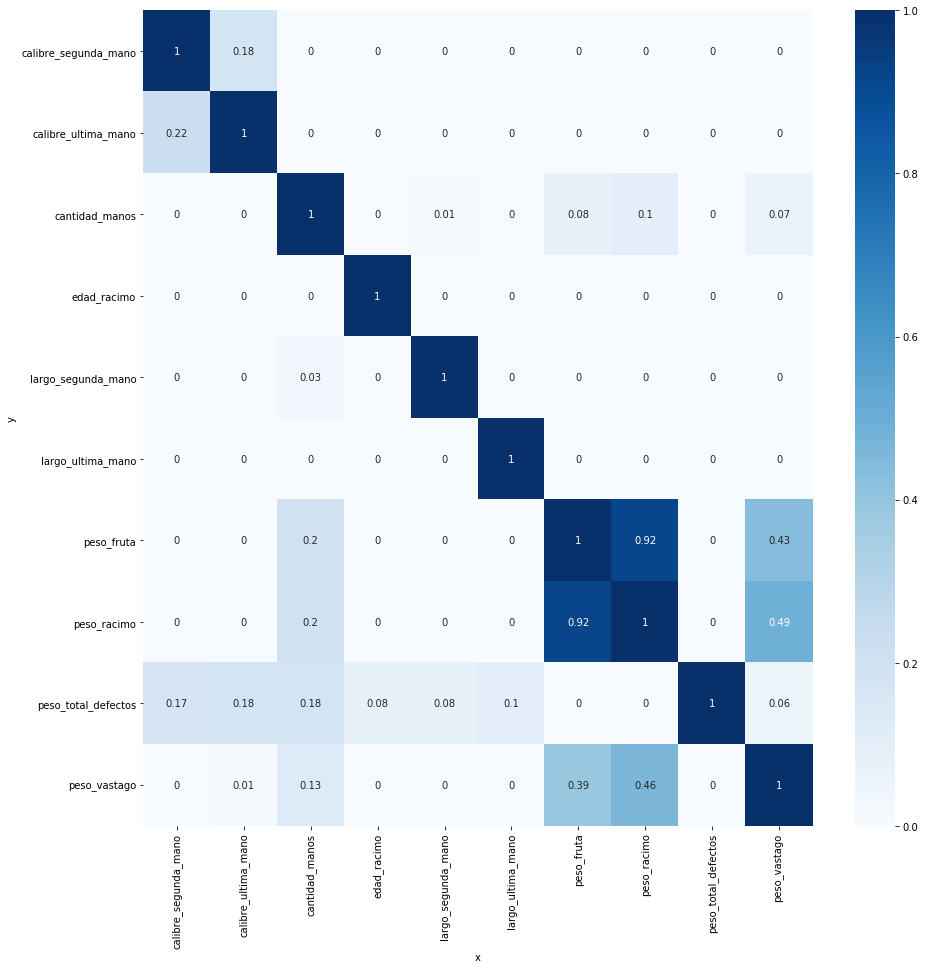

In [32]:
pps_data_clean = pps.matrix(data_clean)[['x', 'y', 'ppscore']].pivot(columns='x', index='y', values='ppscore')
pps_data_clean = pps_data_clean.apply(lambda x: round(x, 2))

fig, ax = plt.subplots(figsize=(15,15)) 
sns.heatmap(pps_data_clean, vmin=0, vmax=1, cmap="Blues", annot=True)

# MODELAMIENTO DE LOS DATOS

Predicción continua o regresión. Es el estudio de un conjunto de datos históricos con el fin de predecir un evento numérico futuro. En este caso la variable objetivo, que es el peso del defecto, es de tipo numérica. https://srnghn.medium.com/machine-learning-trying-to-predict-a-numerical-value-8aafb9ad4d36

### Regresión lineal

#### Preparación

Para poder aplicar modelos de machine learning se deben separar los datos en dos conjuntos, uno con las variables predictoras (features) y la otra es la variable objetivo (peso total de los defectos)

DATOS ORIGINALES

In [27]:
#variables predictoras (features) 
X = data.values[:,:-1]

#variable objetivo
y = data["peso_total_defectos"].values

print (X.shape, y.shape)

(58461, 28) (58461,)


DATOS PRE-PROCESADOS

In [28]:
#variables predictoras (features) 
X = data_clean.values[:,:-1]

#variable objetivo
y = data_clean["peso_total_defectos"].values

print (X.shape, y.shape)

(34752, 9) (34752,)


Creamos los conjuntos de datos de entrenamiento y evaluación (test). Utilizamos la técnica de split para separar los datos en 70% para entrenar el modelo y el 30% para testear el modelo.

In [30]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)
print (X_train, X_test, y_train, y_test)

[[10.88     26.2      12.72     ...  8.312     2.728    23.472   ]
 [10.       16.9      11.       ...  8.542857  1.842857 15.057142]
 [10.869565 22.986956 11.086956 ...  8.143478  2.260869 20.726086]
 ...
 [11.       26.666666 12.333333 ...  8.1       2.633333 24.033333]
 [11.       17.2      12.       ...  8.5       1.8      15.4     ]
 [10.625    18.125    11.5      ...  8.15      1.8125   16.3125  ]] [[10.5      27.68     13.3      ...  8.05      2.951    24.729   ]
 [10.       23.5      12.       ...  8.1       2.2      21.3     ]
 [12.       20.2      12.4      ...  8.24      2.04     18.16    ]
 ...
 [12.       20.       14.       ...  7.9       2.       18.      ]
 [10.727272 20.636363 13.363636 ...  8.445454  2.163636 18.472727]
 [10.875    22.4375   14.1875   ...  8.2       2.24375  20.19375 ]] [11.1  4.4 13.7 ...  2.   4.1  3.1] [11.31  1.8   5.1  ...  1.4   4.2  11.  ]


Normalizados los datos. El proceso de normalización consiste en ajustar los valores medidos en diferentes escalas respecto a una escala común. La normalización aplicada en un modelo de regresión nos permite mejorar el resultado del modelo, ya que busca comprimir o extender los valores de la variable para que estén en un rango definido. Sin embargo, una mala aplicación de la normalización, o una elección descuidada del método de normalización puede arruinar los datos, y con ello el análisis. En el proyecto aplicamos el escalado estándar.


In [31]:
scaler = StandardScaler().fit(X_train)
X_train_n = scaler.transform(X_train)
X_test_n = scaler.transform(X_test)

#### Modelado

In [70]:
lr = LinearRegression()
lr_model = lr.fit(X_train_n, y_train)

#### Evaluación

Usamos como metrica de evaluación el **Coeficiente de determinación (r2)**. 
La mejor puntuación posible es 1.0 y puede ser negativa (because the model can be arbitrarily worse).

In [72]:
lr_model.score(X_test, y_test), lr_model.score(X_train_n, y_train)

(-3064758.839642986, 0.06905799660277923)

In [74]:
print("Coeficiente de determinación con los datos de evaluación = %g" % r2_score(y_test, lr_model.predict(X_test)))
print("Error cuadrático medio con los datos de evaluación = %g" % mean_squared_error(y_test, lr_model.predict(X_test)))
print("Error medio absoluto con los datos de evaluación = %g" % median_absolute_error(y_test, lr_model.predict(X_test)))
print("Raíz del error cuadrático medio con los datos de evaluación = %g" % mean_squared_error(y_test, lr_model.predict(X_test), squared = False))

Coeficiente de determinación con los datos de evaluación = -3.06476e+06
Error cuadrático medio con los datos de evaluación = 8.77039e+07
Error medio absoluto con los datos de evaluación = 9177.12
Raíz del error cuadrático medio con los datos de evaluación = 9365.04


### Árboles de decisión para regresión

El método de árboles de decisión está disponible tanto para predecir números (árboles de regresión) como para predecir categorías (árboles de clasificación).

Su funcionamiento se basa en representar el conjunto histórico de datos a través de un árbol en el que tendremos dos componentes:

- Nodos: presentan una pregunta sobre algunos de los atributos y se genera una bifurcación a partir de la respuesta
- Hojas: Están al final de cada rama y son los valores de la predicción

Cuando se somete un registro al árbol de decisión, este recorre el árbol a través de las respuestas generadas en cada nodo, y al final llegará a una hoja que indica la predicción.

En el caso de los árboles de regresión, la variable a predecir es numérica, es decir que el resultado final de la predicción será un número

#### Preparación

La preparación es la misma del modelo de regresión lineal.

#### Modelado

In [79]:
tree_model = DecisionTreeRegressor()

In [84]:
tree_model.fit(X_train_n, y_train)

DecisionTreeRegressor()

#### Evaluación

We wish to understand how good our model is; there are a few different metrics we can use. We will evaluate mean squared error (MSE) and mean absolute error (MAE)

We import scikit-learn's mean squared error and sckit-learn's mean absolute error

We calculate the errors for our training data

In [86]:
tree_mse = mean_squared_error(y_train, tree_model.predict(X_train_n))
tree_rmse = mean_squared_error(y_train, tree_model.predict(X_train_n), squared = False)
tree_mae = mean_absolute_error(y_train, tree_model.predict(X_train_n))
tree_r2 = r2_score(y_train, modelo_tree.predict(X_train_n))

print("Decision Tree training: mse = ",tree_mse," & mae = ",tree_mae," & rmse = ", tree_rmse," & r2 = ", tree_r2)

Decision Tree training: mse =  0.041383409447121516  & mae =  0.017247795368324843  & rmse =  0.20342912634901011  & r2 =  0.3346665977558627


The easier metric to understand is the mean absolute error, this means that our predictions were perfect for the decision tree model but on average 0.17 away from the true prediction with the random forest model. Mean squared error, and consequently root mean squared error (RMSE), results in predictions further and further from the true value are punished more.

We can calculate the same on the test data to understand how we the models are generalised. to understand is the mean absolute error, this means that our predictions were perfect for the decision tree model but on average 0.17 away from the true prediction with the random forest model. Mean squared error, and consequently root mean squared error (RMSE), results in predictions further and further from the true value are punished more.

We can calculate the same on the test data to understand how we the models are generalised.

In [87]:
tree_test_mse = mean_squared_error(y_test, tree_model.predict(X_test_n))
tree_test_rmse = mean_squared_error(y_test, tree_model.predict(X_test_n), squared = False)
tree_test_mae = mean_absolute_error(y_test, tree_model.predict(X_test_n))
tree_test_r2 = r2_score(y_test, modelo_tree.predict(X_test_n))

print("mse = ",test_mse," & mae = ",test_mae," & rmse = ", test_rmse, " & R2 = ", tree_test_r2)

mse =  24.53162009015922  & mae =  3.686072319201995  & rmse =  4.9529405498309  & R2 =  0.292313487441757


So even though we were seeing perfect results on the training data for our decision tree model, it is actually performing worse than the random forest model on our test data.

###  Random Forest para regresión

#### Preparación

La preparación es la misma del modelo de regresión lineal.

#### Modelado

In [89]:
rf_model = RandomForestRegressor()

In [90]:
rf_model.fit(X_train_n, y_train)

RandomForestRegressor()

#### Evaluación

In [91]:
rf_mse = mean_squared_error(y_train, rf_model.predict(X_train_n))
rf_rmse = mean_squared_error(y_train, rf_model.predict(X_train_n), squared = False)
rf_mae = mean_absolute_error(y_train, rf_model.predict(X_train_n))
rf_r2 = r2_score(y_train, rf_model.predict(X_train_n))

print("Random Forest training: mse = ",rf_mse," & mae = ",rf_mae," & rmse = ", rf_rmse," & r2 = ", rf_r2)

Random Forest training: mse =  2.371468489375209  & mae =  1.118697606141935  & rmse =  1.5399573011532524  & r2 =  0.9174159597299487


In [93]:
rf_test_mse = mean_squared_error(y_test, rf_model.predict(X_test_n))
rf_test_rmse = mean_squared_error(y_test, rf_model.predict(X_test_n), squared = False)
rf_test_mae = mean_absolute_error(y_test, rf_model.predict(X_test_n))
rf_test_r2 = r2_score(y_test, rf_model.predict(X_test_n))

print("Random Forest test: mse = ",rf_test_mse," & mae = ",rf_test_mae," & rmse = ", rf_test_rmse," & r2 = ", rf_test_r2)

Random Forest test: mse =  16.59343890639341  & mae =  2.9896919739661167  & rmse =  4.073504499370709  & r2 =  0.42015224915319427


### Redes neuronales

Neural networks can learn complex patterns using layers of neurons which mathematically transform the data. The layers between the input and output are referred to as “hidden layers”. A neural network can learn relationships between the features that other algorithms cannot easily discover.

We are using scikit-learn's MLP Classifier which is a simple type of neural network called a multi-layer perceptron (MLP).

#### Preparación

#### Modelado

In [89]:
MLP_model = MLPRegressor()
MLP_model.fit(X_train_n, y_train)

#### Evaluación

We calculate accuracy for our training data

In [ ]:
accuracy_score(y_train, model.predict(X_train_n))

We have an accuracy of 100%! More importantly, we should check if we find good results on unseen data (to ensure we haven't overfit). We calculate the accuracy for our test data

In [ ]:
accuracy_score(y_test, model.predict(X_test_n))

### K Nearest Neighbors

KNN realiza una predicción para una nueva observación buscando las observaciones del conjunto de entrenamiento más similares y agrupando sus valores.

#### Preparación

La preparación es la misma del modelo de regresión lineal.

#### Modelado

In [94]:
knn_model = KNeighborsRegressor()
knn_model.fit(X_train_n, y_train)

KNeighborsRegressor()

#### Evaluación

In [95]:
mse = mean_squared_error(y_train, knn_model.predict(X_train_n))
rmse = mean_squared_error(y_train, knn_model.predict(X_train_n), squared = False)
mae = mean_absolute_error(y_train, knn_model.predict(X_train_n))
r2 = r2_score(y_train, knn_model.predict(X_train_n))

print("mse = ",mse," & mae = ",mae," & rmse = ", rmse," & r2 = ", r2)

mse =  15.990109385184576  & mae =  2.9572024993833756  & rmse =  3.9987634820259843  & r2 =  0.4431602851545725


We can calculate the same on the test data to understand how we the model is generalised.

In [97]:
knn_mse = mean_squared_error(y_test, knn_model.predict(X_test_n))
knn_mae = mean_absolute_error(y_test, knn_model.predict(X_test_n))
knn_rmse = mean_squared_error(y_test, knn_model.predict(X_test_n), squared = False)
knn_r2 = r2_score(y_test, knn_model.predict(X_test_n))

print("mse = ", knn_mse," & mae = ", knn_mae," & rmse = ", knn_rmse," & r2 = ", knn_r2)

mse =  24.53162009015922  & mae =  3.686072319201995  & rmse =  4.9529405498309  & r2 =  0.14275727809342553


## Búsqueda de los mejores hiperparámetros

In [57]:
# definimos los rangos de los parámetros
param_grid_tree = {"max_depth" : [1,5,7,11],
           "min_samples_leaf":[1,4,7,10],
           "max_leaf_nodes":[20,50,80] }
   
grid_tree = GridSearchCV(estimator = tree_model, param_grid = param_grid_tree, cv = 3, n_jobs = -1, verbose = 2) 
   
# ajustamos el modelo para la búsqueda en la cuadrícula
grid_tree.fit(X_train_n, y_train) 
 
# mostramos los mejores parámetros luego del aprendizaje
print(grid_tree.best_params_) 
grid_tree_predictions = grid_tree.predict(X_test) 

# seleccionamos el mejor modelo
modelo_tree = grid_tree.best_estimator_

Fitting 3 folds for each of 48 candidates, totalling 144 fits
{'max_depth': 11, 'max_leaf_nodes': 80, 'min_samples_leaf': 10}


In [68]:
tree_test_mse = mean_squared_error(y_test, modelo_tree.predict(X_test_n))
tree_test_rmse = mean_squared_error(y_test, modelo_tree.predict(X_test_n), squared = False)
tree_test_mae = mean_absolute_error(y_test, modelo_tree.predict(X_test_n))
tree_test_r2 = r2_score(y_test, modelo_tree.predict(X_test_n))

print("mse = ",test_mse," & mae = ",test_mae," & rmse = ", test_rmse, " & R2 = ", tree_test_r2)

mse =  24.53162009015922  & mae =  3.686072319201995  & rmse =  4.9529405498309  & R2 =  0.292313487441757


In [49]:
# definimos los rangos de los parámetros
param_grid_rf = {'bootstrap': [True],
              'max_depth': [10, 40],
              'min_samples_leaf': [1, 2],
              'min_samples_split': [2],
              'n_estimators': [200, 800]}
   
grid_rf = GridSearchCV(estimator = rf_model, param_grid = param_grid_rf, cv = 3, n_jobs = -1, verbose = 2) 
   
# ajustamos el modelo para la búsqueda en la cuadrícula
grid_rf.fit(X_train_n, y_train) 
 
# mostramos los mejores parámetros luego del aprendizaje
print(grid_rf.best_params_) 
grid_rf_predictions = grid_rf.predict(X_test) 

# seleccionamos el mejor modelo
modelo_rf = grid_rf.best_estimator_

Fitting 3 folds for each of 8 candidates, totalling 24 fits
{'bootstrap': True, 'max_depth': 40, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 800}


In [66]:
rf_test_mse = mean_squared_error(y_test, modelo_rf.predict(X_test_n))
rf_test_rmse = mean_squared_error(y_test, modelo_rf.predict(X_test_n), squared = False)
rf_test_mae = mean_absolute_error(y_test, modelo_rf.predict(X_test_n))
rf_test_r2 = r2_score(y_test, modelo_rf.predict(X_test_n))

print("Random Forest test: mse = ",rf_test_mse," & mae = ",rf_test_mae," & rmse = ", rf_test_rmse, " & R2 = ", rf_test_r2)

Random Forest test: mse =  16.299973960494476  & mae =  2.9561011100829004  & rmse =  4.037322622790316  & R2 =  0.4304072053314649


In [59]:
# definimos los rangos de los parámetros
param_grid_knn = {'n_neighbors': range(1,20)}
   
grid_knn = GridSearchCV(estimator = knn_model, param_grid = param_grid_knn, cv = 3, n_jobs = -1, verbose = 2) 
   
# ajustamos el modelo para la búsqueda en la cuadrícula
grid_knn.fit(X_train_n, y_train) 
 
# mostramos los mejores parámetros luego del aprendizaje
print(grid_knn.best_params_) 
grid_knn_predictions = grid_knn.predict(X_test) 

# seleccionamos el mejor modelo
modelo_knn = grid_knn.best_estimator_

Fitting 3 folds for each of 19 candidates, totalling 57 fits
{'n_neighbors': 18}


In [67]:
knn_mse = mean_squared_error(y_test, modelo_knn.predict(X_test_n))
knn_mae = mean_absolute_error(y_test, modelo_knn.predict(X_test_n))
knn_r2 = r2_score(y_test, modelo_knn.predict(X_test_n))
knn_rmse =  mean_squared_error(y_test, modelo_knn.predict(X_test_n), squared = False)

print("mse = ", knn_mse," & mae = ", knn_mae," & rmse = ", knn_rmse, " & R2 = ", knn_r2)

mse =  23.075877621680604  & mae =  3.6691979985932606  & rmse =  4.803735798488568  & R2 =  0.19362732383386994


# VALIDACIÓN

Una vez el modelo ha sido evaluado y el resultado es el esperado, se someten datos nuevos al modelo para realizar la predicción.
